## Homework 10

In this homework, you are going to use and compare two different trackers (of your liking) and compare the results.
### Step 1
Decide what video you are going to use for this homework, select an object and generate the template. You can use any video you want (your own, from Youtube, etc.)
and track any object you want (e.g. a car, a pedestrian, etc.).


In [94]:
import cv2
import numpy as np
from matplotlib import pyplot as plt
plt.rcParams['figure.figsize'] = [10, 8]
# Open the video and read first frame
cap = cv2.VideoCapture("../data/traffic.mp4")
ret, first_frame = cap.read()


# Detect cordinates the vehicle

bbox = (344, 379, 122, 102)

# Теперь переменные first_frame и bbox готовы для инициализации трекера
# cap.release() # Освобождать ресурсы пока не нужно, видео еще понадобится


### Step 2
Initialize a tracker

In [95]:
tracker = cv2.TrackerCSRT_create()
ok = tracker.init(first_frame, bbox)

### Step 3
Run the tracker on the video and the selected object. Run the tracker for around 10-15 frames.

In [96]:
# Пропускаем первый кадр, который использовался для инициализации
ret, _ = cap.read()

# Списки для хранения всех результатов
all_frames = []
all_results = []

# Цикл обработки всего видео
while True:
    # Читаем следующий кадр
    ret, frame = cap.read()

    # Если видео закончилось, выходим
    if not ret:
        break

    # Обновляем трекер
    ok, new_bbox = tracker.update(frame)

    # Сохраняем оригинальный кадр и результат трекера
    all_frames.append(frame)
    all_results.append((ok, new_bbox))

# Освобождаем ресурсы
cap.release()

### Step 4
For each frame, print the bounding box on the image and save it.

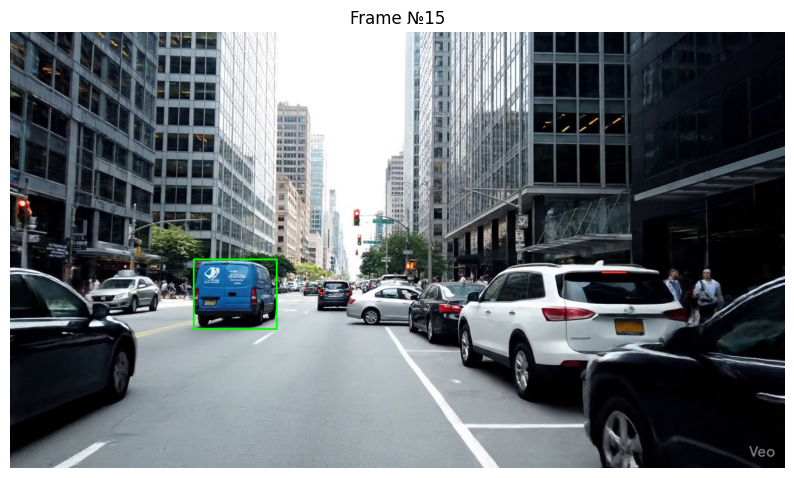

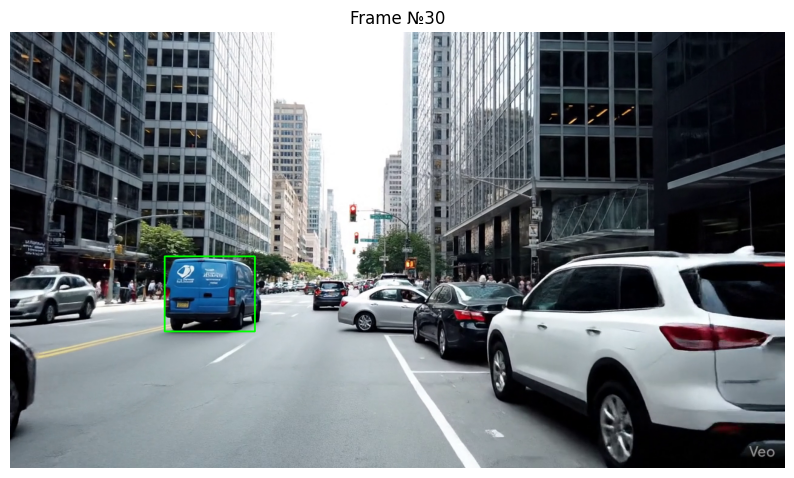

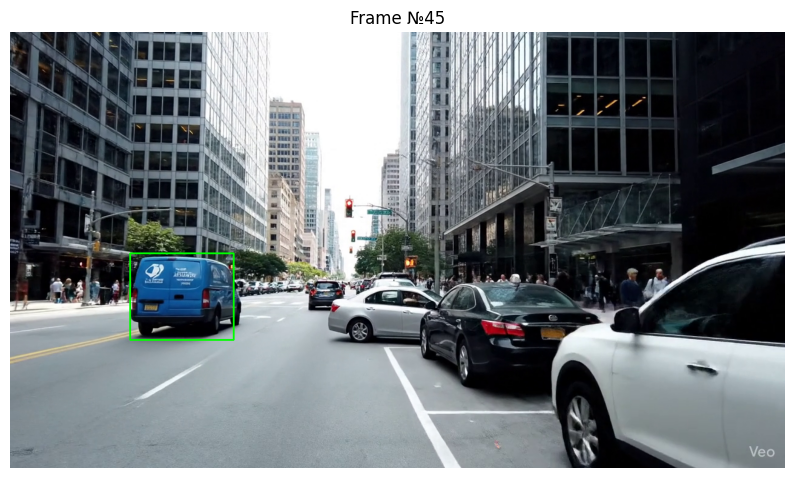

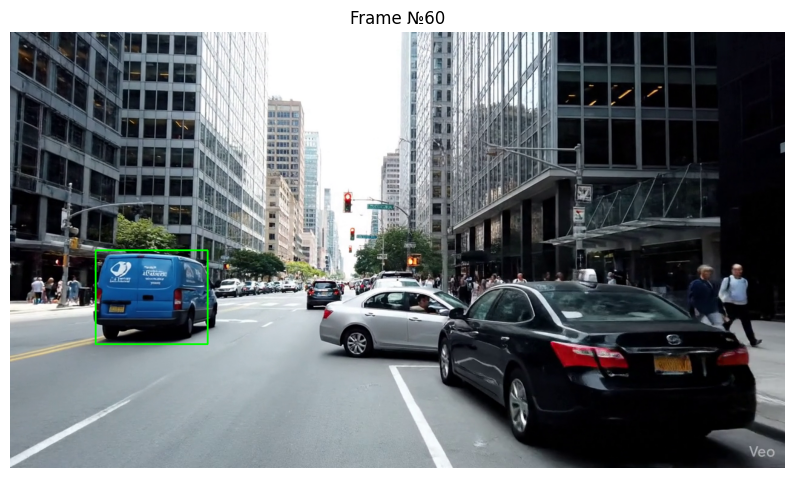

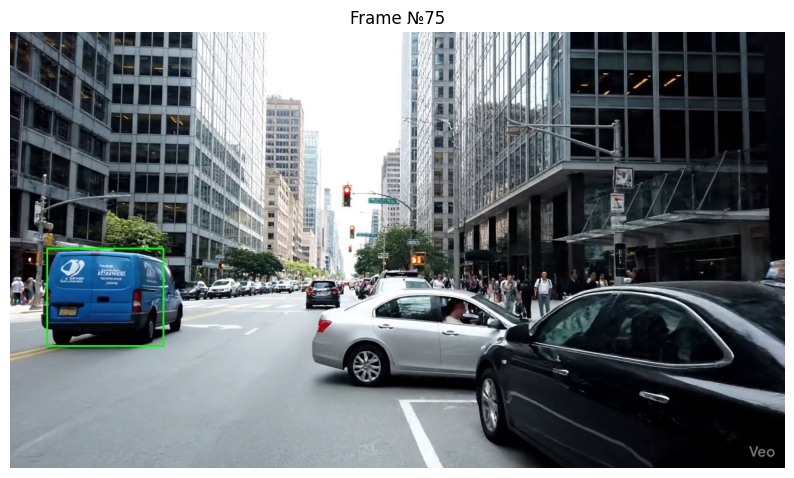

...

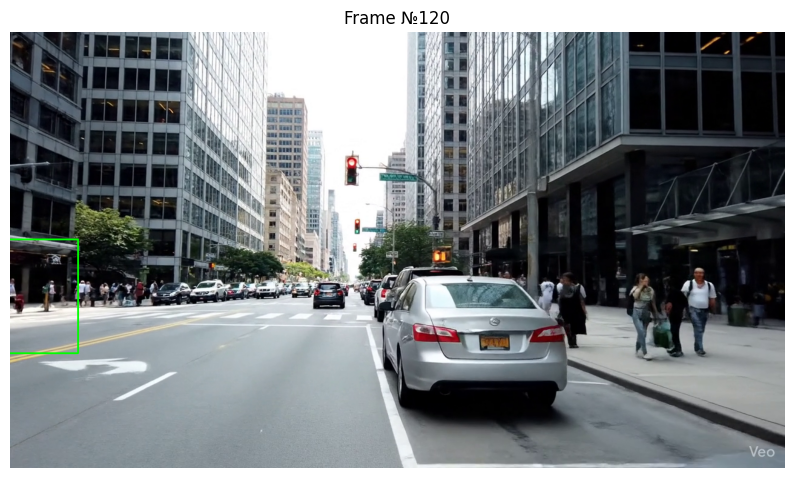

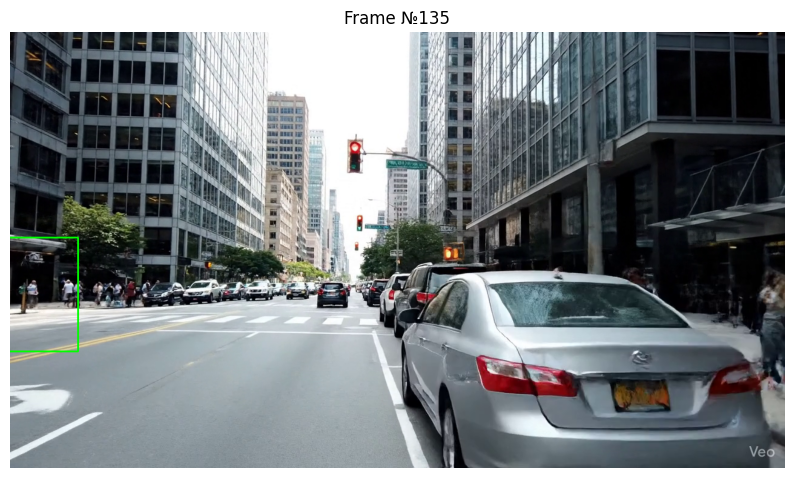

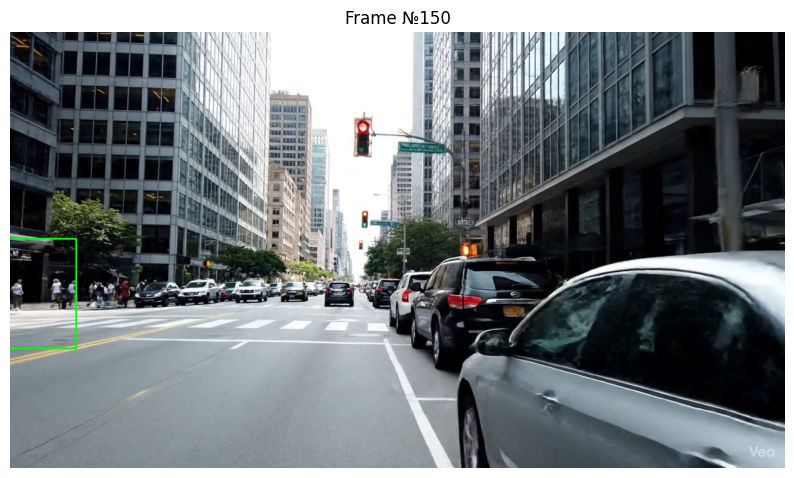

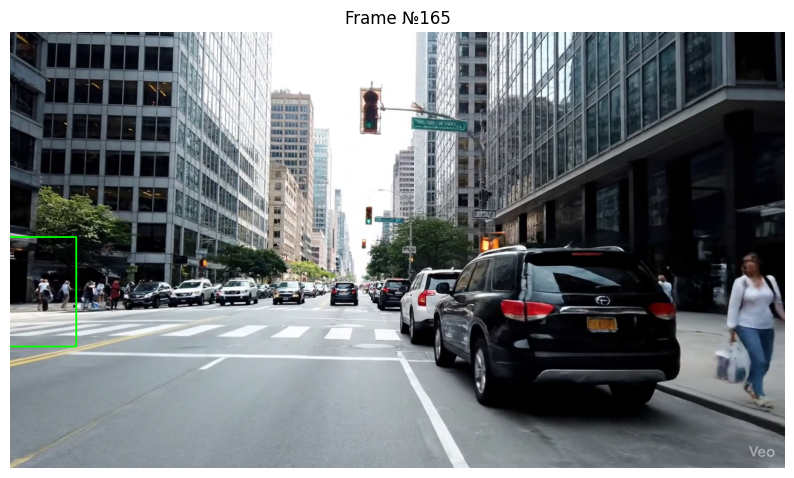

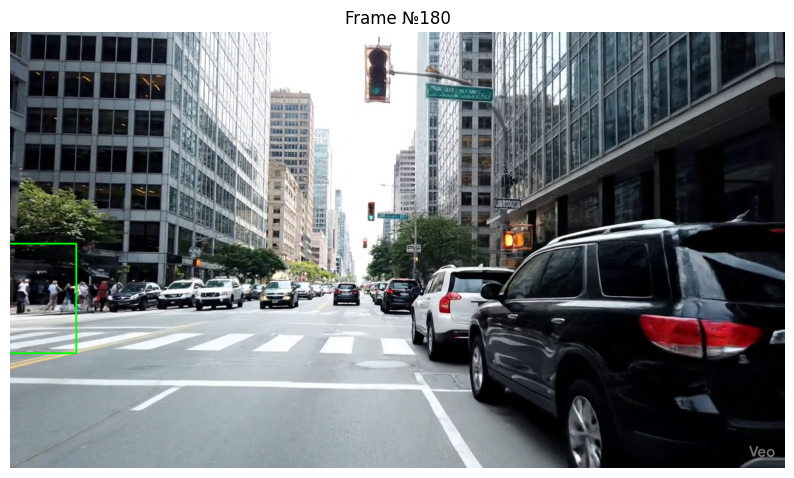

In [97]:
for i, (frame, (ok, bbox)) in enumerate(zip(all_frames, all_results)):
    # Номер кадра (начинаем с 1)
    frame_number = i + 1

    # Проверяем, является ли кадр 15-м, 30-м, 45-м и т.д.
    if frame_number % 15 == 0:

        # Копируем кадр, чтобы рисовать на нём
        frame_to_show = frame.copy()

        # Рисуем рамку, если отслеживание было успешным
        if ok:
            (x, y, w, h) = [int(v) for v in bbox]
            cv2.rectangle(frame_to_show, (x, y), (x + w, y + h), (0, 255, 0), 2)
        else:
            cv2.putText(frame_to_show, "Tracking Failure", (100, 80),
                        cv2.FONT_HERSHEY_SIMPLEX, 0.75, (0, 0, 255), 2)

        # Конвертируем цвет и выводим изображение
        plt.imshow(cv2.cvtColor(frame_to_show, cv2.COLOR_BGR2RGB))
        plt.title(f"Frame №{frame_number}")
        plt.axis('off')
        plt.show()

### Step 5
Select a different tracker (e.g. CSRT) and repeat steps 2, 3 and 4.

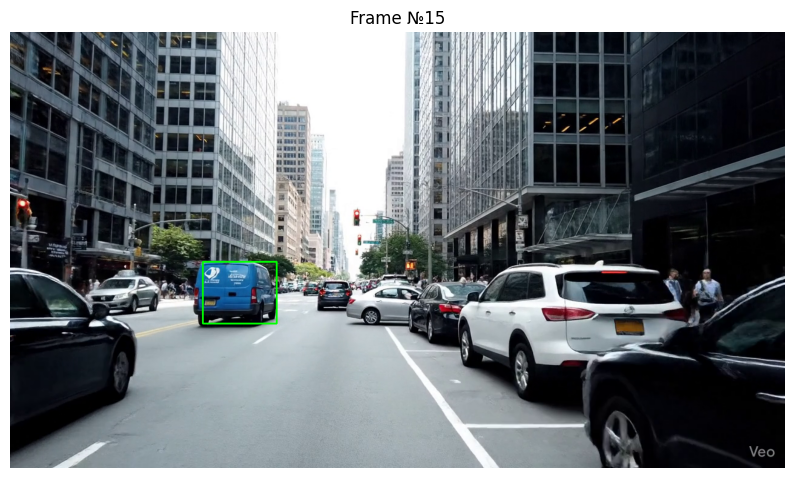

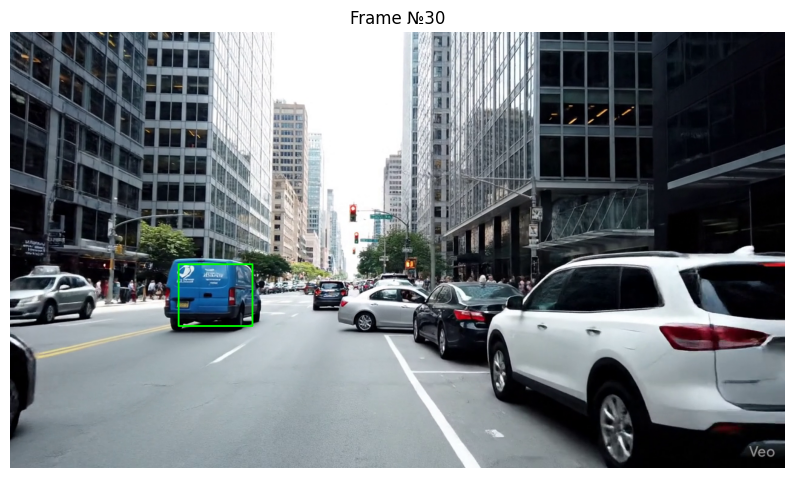

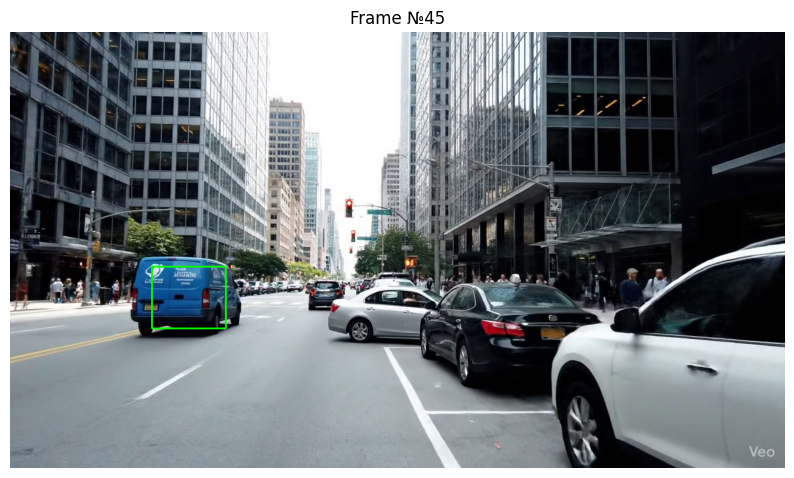

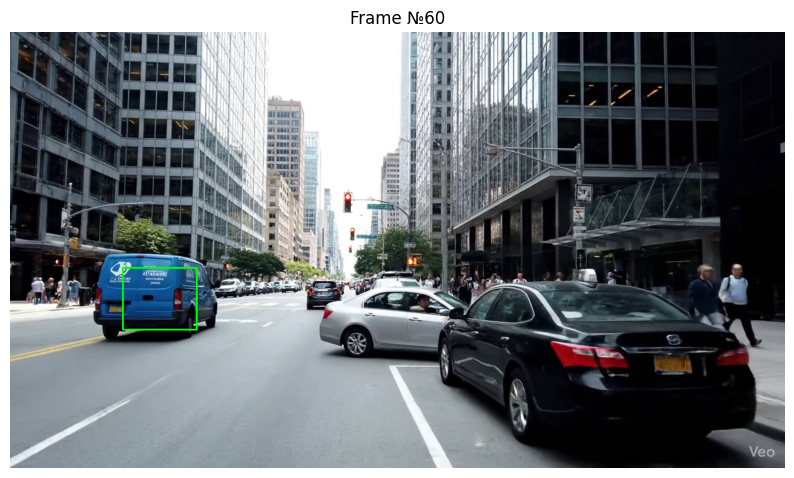

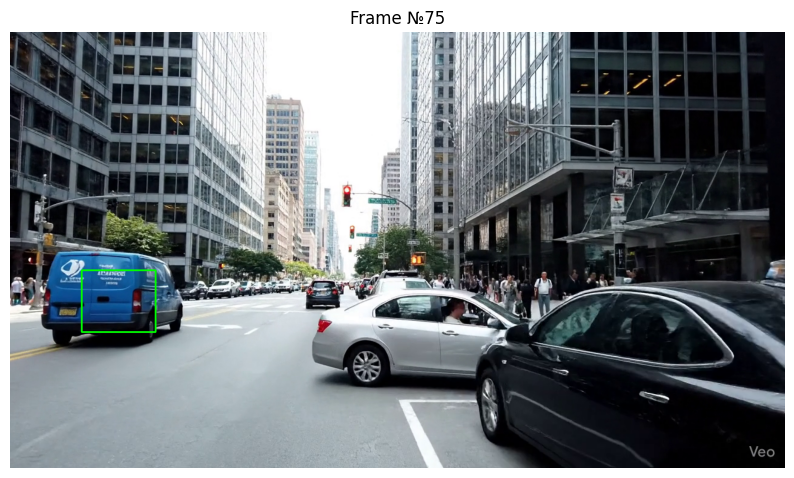

...

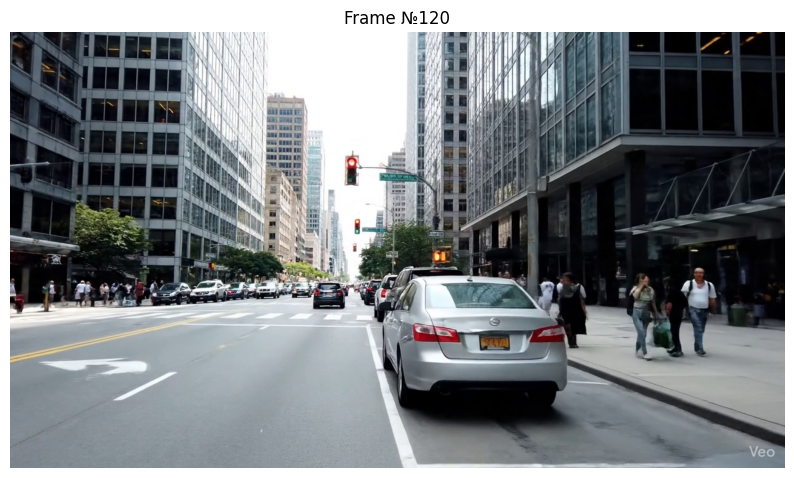

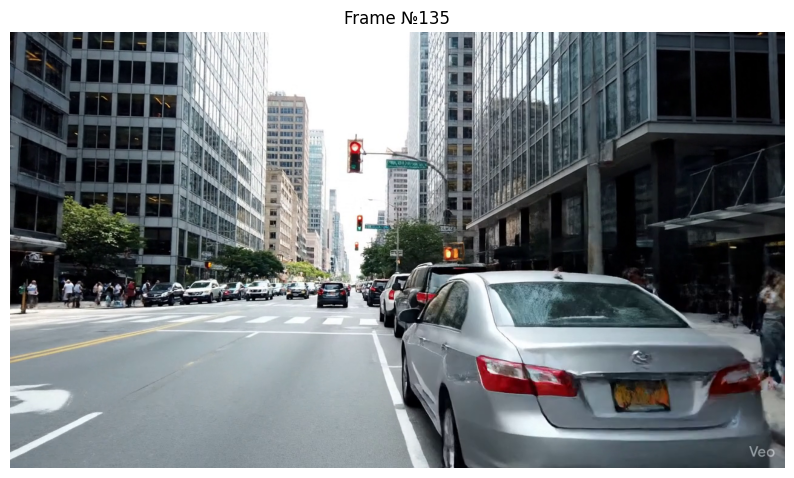

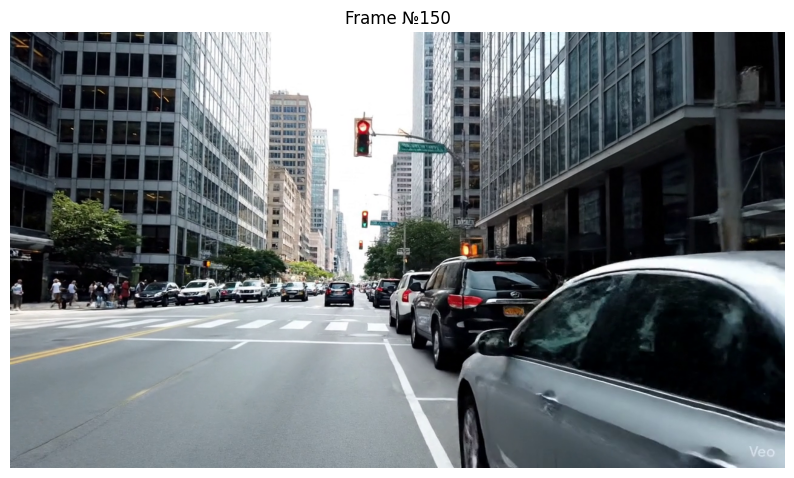

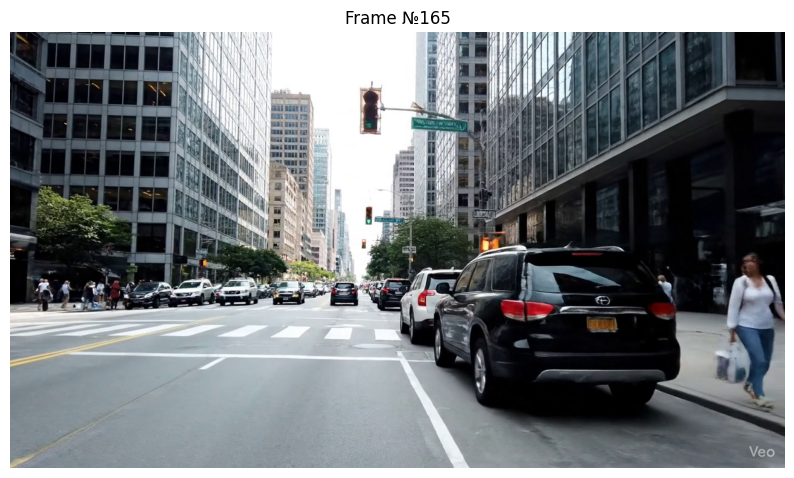

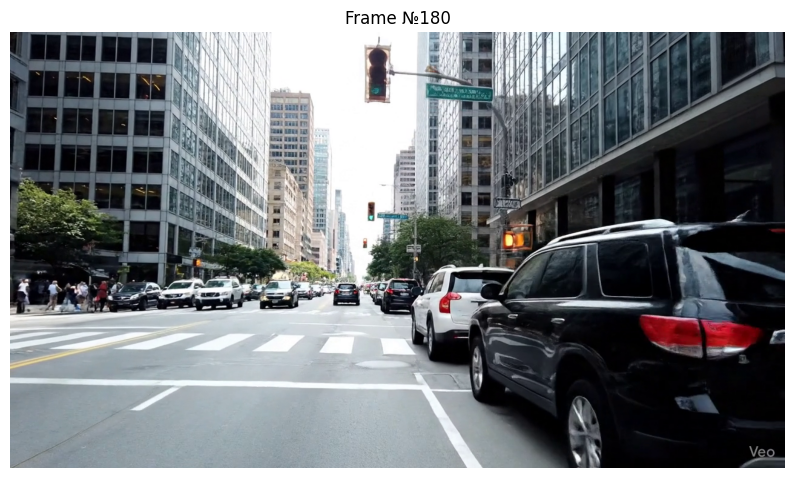

In [98]:

plt.rcParams['figure.figsize'] = [10, 8]
# Open the video and read first frame
cap = cv2.VideoCapture("../data/traffic.mp4")
ret, first_frame = cap.read()


# Detect cordinates the vehicle
bbox = (344, 379, 122, 102)
tracker = cv2.TrackerKCF_create()
ok = tracker.init(first_frame, bbox)
# Теперь переменные first_frame и bbox готовы для инициализации трекера
# cap.release() # Освобождать ресурсы пока не нужно, видео еще понадобится

# Пропускаем первый кадр, который использовался для инициализации
ret, _ = cap.read()

# Списки для хранения всех результатов
all_frames = []
all_results = []

# Цикл обработки всего видео
while True:
    # Читаем следующий кадр
    ret, frame = cap.read()

    # Если видео закончилось, выходим
    if not ret:
        break

    # Обновляем трекер
    ok, new_bbox = tracker.update(frame)

    # Сохраняем оригинальный кадр и результат трекера
    all_frames.append(frame)
    all_results.append((ok, new_bbox))

# Освобождаем ресурсы
cap.release()
for i, (frame, (ok, bbox)) in enumerate(zip(all_frames, all_results)):
    # Номер кадра (начинаем с 1)
    frame_number = i + 1

# Проверяем, является ли кадр 15-м, 30-м, 45-м и т.д.
    if frame_number % 15 == 0:

        # Копируем кадр, чтобы рисовать на нём
        frame_to_show = frame.copy()

        # Рисуем рамку, ТОЛЬКО если отслеживание было успешным
        if ok:
            (x, y, w, h) = [int(v) for v in bbox]
            cv2.rectangle(frame_to_show, (x, y), (x + w, y + h), (0, 255, 0), 2)
        # Блок 'else' удален, поэтому при неудаче ничего не рисуется

        # Конвертируем цвет и выводим изображение
        plt.imshow(cv2.cvtColor(frame_to_show, cv2.COLOR_BGR2RGB))
        plt.title(f"Frame №{frame_number}")
        plt.axis('off')
        plt.show()

### Step 6
Compare the results:
* Do you see any differences? If so, what are they?
* Does one tracker perform better than the other? In what ways?

### Answers
* Yes. KCF was very fast. But not accurate. However, if we need to quickly capture an object's movement, it's perfect.
* CSRT is very slow, but the frame adhered precisely to the object. For applications where accuracy is important, it's a better choice